In [11]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
import scipy.ndimage as scimg
from scipy.ndimage import gaussian_filter as gf
from scipy.stats import binned_statistic
from photutils import DAOStarFinder, aperture_photometry, CircularAperture
from astropy.stats import mad_std
from astropy.modeling.functional_models import Gaussian1D
import os

# I think I like this best for interactive figures, frankly
#%matplotlib qt 
from astropy.modeling import models, fitting
import warnings

In [12]:
# path = '/Users/ian/Desktop/2020-01-07--04-14-24--151.fits'
path = "C:/Users/16472/Desktop/fft_pmc_filtering"

In [85]:
# Helper Functions

def Imshow(image, title, **kwargs):
    plt.figure(figsize=(16,12))
    plt.title(title)
    plt.imshow(image, origin='lower', interpolation='none', **kwargs)
    plt.colorbar(shrink=0.8)

def psd2d(image):
    fft = np.fft.fft2(image)
    p2d = np.power(np.abs(fft), 2)
    return p2d

def FindSources(image, threshold_sigma = 3.5, fwhm = 4.7):
    bkg_sigma = mad_std(image) # The background variance of the image
    daofind = DAOStarFinder(fwhm = fwhm, 
                            threshold = threshold_sigma*bkg_sigma, 
                            exclude_border = True)
    sources = daofind(image) 
    positions = [(x,y) for x,y in zip(sources['xcentroid'].data, sources['ycentroid'].data)]
    apertures = CircularAperture(positions, r=fwhm)
    
    return sources, apertures

def BinCenter(bin_edges):
    return (bin_edges[1:] + bin_edges[0:-1])/2.

In [50]:
# Introduce images here.

# Image
hdul = astropy.io.fits.open("2020-01-07--04-14-24--151.fits")
image_norm = hdul[0].data

# Flat- Field
xsc1_ff = np.load("xsc1_flat_Field.npy")

# Filtering and Flat Fielding
image_raw = image_array / xsc1_ff
image_raw -= np.mean(image_norm)

smimage = ndimage.gaussian_filter(filtered_image, sigma=5)

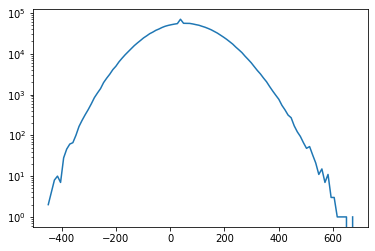

In [52]:
h_image_raw, be_image_raw = np.histogram(image_raw, bins=100)
plt.semilogy(BinCenter(be_image_raw), h_image_raw)

Much more Gaussian looking compared to when the flat field is not applied

In [53]:
%%time
""" It's a huge help to sort of "flatten" the image by removing low order polynomials, 
at least as far as finding "hot pixels".  I'm not actually sure why this is such 
a slow process; it could probably be speeded up by a direct coding of the linear fit. 
That's the reason for the try/except: if you've already run the notebook and done this 
calculation, just save it.
"""

# dimensions and a grid for fitting
ny, nx = image_raw.shape
x, y = np.mgrid[:ny, :nx]

# Fit the data using astropy.modeling
p_init = models.Polynomial2D(degree=3)
fit_p = fitting.LevMarLSQFitter()

with warnings.catch_warnings():
    # Ignore model linearity warning from the fitter
    warnings.simplefilter('ignore')
    p = fit_p(p_init, x, y, image_raw)

image_flatten = image_raw-p(x,y)

Wall time: 2min 49s


Notice that the image now has zero mean, and also goes to zero at the edges.  (This latter will be helpful when we go to Fourier transform ... it accomplishes a lot of what a "window" would do.)  We can be pretty confident that we're not missing any stars in the thing we subtracted, since it varies on such large scales.

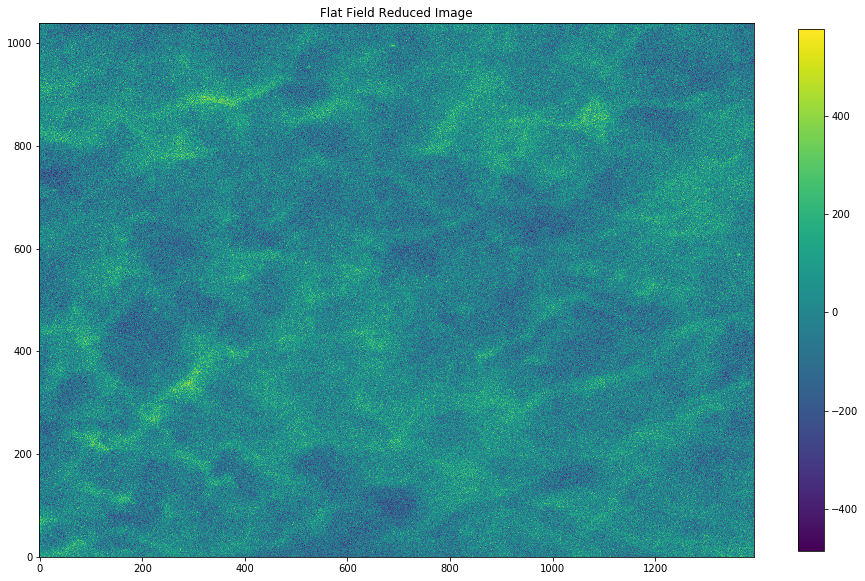

In [55]:
%matplotlib inline
Imshow(image_flatten, title="Flat Field Reduced Image")

Now the anomalously low pixels jump out at us, and it becomes clearer that the remaining distribution is ... pretty Gaussian, actually.

In [58]:
var_image_fl = mad_std(image_flatten)
threshold = 6*var_image_fl # the sigma here is a bit cherry-picked ...

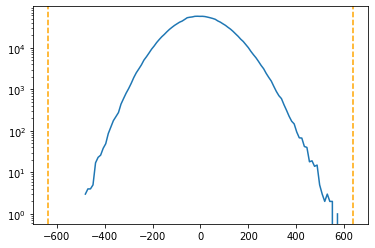

In [59]:
h_image_fl, be_image_fl = np.histogram(image_flatten, bins=100)
plt.semilogy(BinCenter(be_image_fl), h_image_fl)
plt.axvline(-threshold,color='orange',linestyle='--')
plt.axvline(+threshold,color='orange',linestyle='--')

We dont even need to set thresholds here compared to the normal image

In [72]:
wh_outliers = np.argwhere(np.logical_or(image_flatten < -threshold, image_flatten > threshold))

In [73]:
image_flatten_no_outliers = image_flatten.copy()
# Let's get rid of these discrepant pixels
for outlier in wh_outliers:
    med = np.median(image_flatten[outlier[0]-1:outlier[0]+2, outlier[1]-1:outlier[1]+2])
    image_flatten_no_outliers[outlier[0], outlier[1]] = med
    print(image_flatten[outlier[0], outlier[1]], med)
#image_flatten_no_outliers[wh_outer]

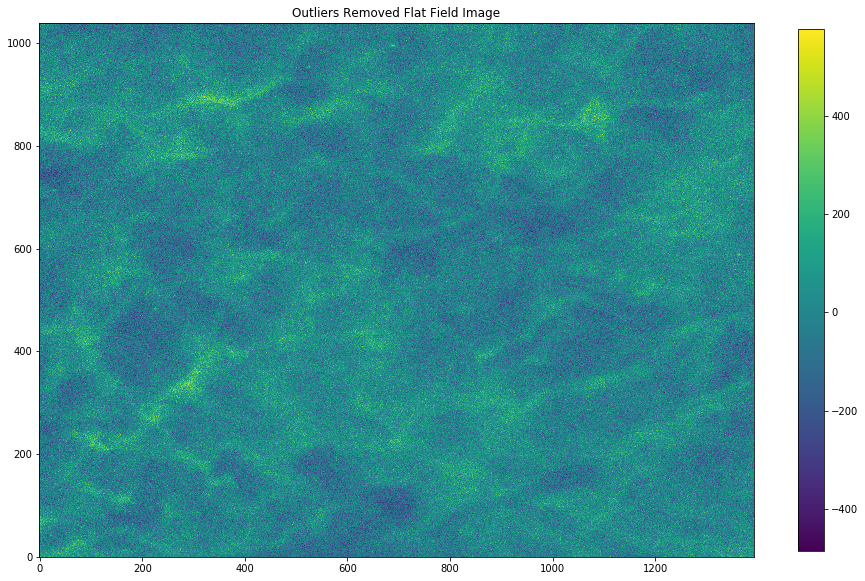

In [74]:
Imshow(image_flatten_no_outliers, title="Outliers Removed Flat Field Image")

We can see that the horizontal and vertical streaks aren't here compared to the image without a flat field reduction


In [75]:
h_image_flno, be_image_flno = np.histogram(image_flatten_no_outliers, bins=100)
gaussian1d = Gaussian1D()
dist_image = gaussian1d.evaluate(BinCenter(be_image_flno), amplitude=h_image_flno.max(), 
                               mean=0, stddev=np.std(image_flatten_no_outliers))

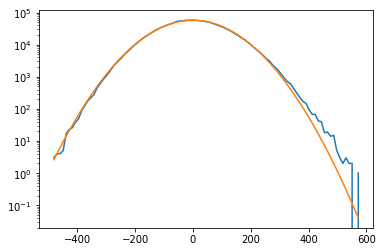

In [76]:
plt.semilogy(BinCenter(be_image_flno), h_image_flno)
plt.plot(BinCenter(be_image_flno), dist_image)

pretty similar to the normal image actually...

Having gotten rid of the big large-scale features and the outliers, let's look at what's left.

In [77]:
hdu = fits.PrimaryHDU(image_flatten_no_outliers-np.mean(image_flatten_no_outliers))
hdu.writeto('starcam_preproc.fits', overwrite=True)

In [78]:
# Generally speaking, the mean is not a useful quantity
image = image_flatten_no_outliers
image -= np.mean(image)

The simplest thing that seems to work reasonably well is to low-pass filter with a Gaussian filter, subtract that from the image, and then gaussian filter again.  If the image is $I$ and a Gaussian filter with width $\sigma$ is denoted $G_\sigma[I]$, then this can be written
\begin{equation}
\tilde{I} = G_{\sigma_1}[I] - G_{\sigma_2}[I]
\end{equation}
where $\sigma_2 > \sigma_1$.

A choice that works OK is shown below.

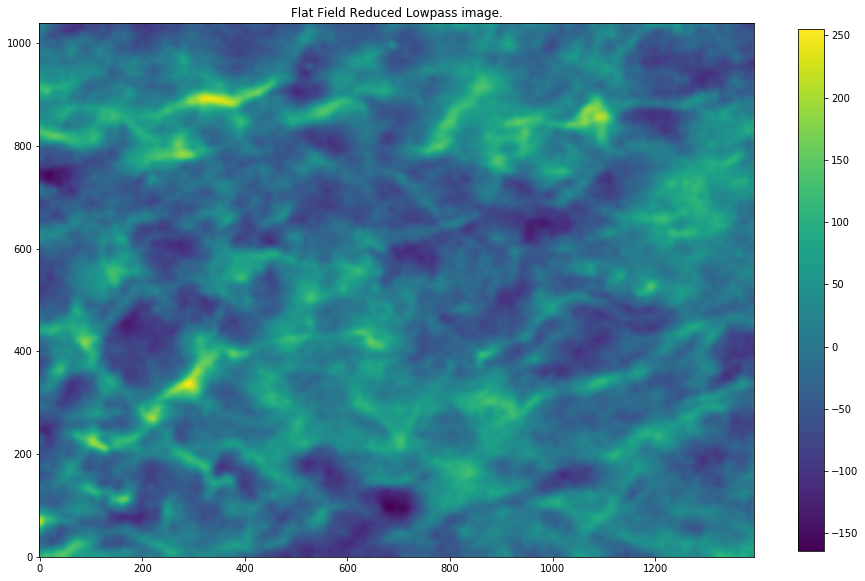

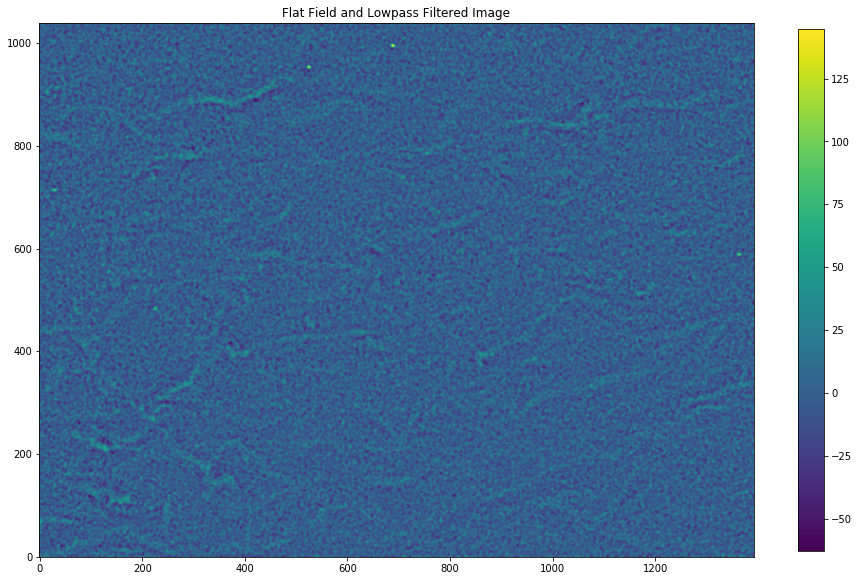

In [79]:
sigma_1 = 2
sigma_2 = 5

image_lowpass = gf(image, sigma=sigma_2)
image_ptsrc = gf(image, sigma=sigma_1) 

Imshow(image_lowpass, title="Flat Field Reduced Lowpass image.")
Imshow(image_ptsrc - image_lowpass, title="Flat Field and Lowpass Filtered Image")

Threshold set to make the star candidates more visible


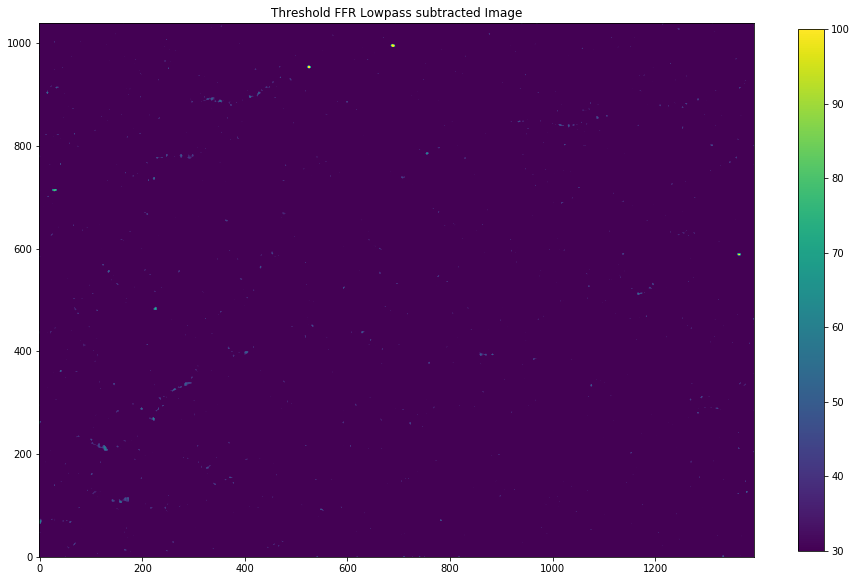

In [82]:
Imshow(image_ptsrc - image_lowpass, title='Threshold FFR Lowpass subtracted Image', vmin=30, vmax=100)

How well does James' source finding work here?


In [83]:
image_srcfind = image_ptsrc - image_lowpass

In [86]:
# We need to specify the size of the star in the image for best results. 
# Since we set a smoothing of sigma_1, we should pick 2.35 * sigma_1
fwhm = 2.35 * sigma_1
sources, apertures = FindSources(image_srcfind, fwhm = fwhm, threshold_sigma=4)
sources

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64
1,1377.4581932605838,126.33552281133753,0.3687376907271647,0.12445662647082695,0.0396564035762215,25,0.0,52.94280116663103,1.0260597205192272,-0.027931597692776967
2,225.90718811429133,483.20646328119767,0.3428853786974276,0.0932848354968311,-0.2966447592733239,25,0.0,75.38476882871633,1.0745757711998905,-0.0780926104197296
3,1362.2673231261363,589.2572589362346,0.3543915976233063,-0.2073680961960311,-0.685025480587439,25,0.0,104.32817562292644,1.570238287546759,-0.48991390668242324
4,30.967531494938772,714.0530566760996,0.35098519062620875,0.11130205371934591,-0.8456912306404649,25,0.0,85.00182021652435,1.2418755948860294,-0.23519523122663946
5,755.0311010771629,785.2335597088087,0.352220558202394,0.021419141858989996,-0.26219019953427974,25,0.0,67.1863373440031,1.0124502542527498,-0.013434234446954749
6,525.0758551290045,954.0951673996261,0.3452217551390702,-0.22205784043072388,-0.6174524824776552,25,0.0,122.776324942829,1.8375788390847463,-0.6606149525809945
7,688.8669868673499,995.8580662989006,0.3571137012295446,-0.17685884015590758,-0.6817010278362315,25,0.0,144.6496118667648,2.079056918126674,-0.7946659478235789


We found 7 Sources (vs. 3) when applying the flat field to our image.

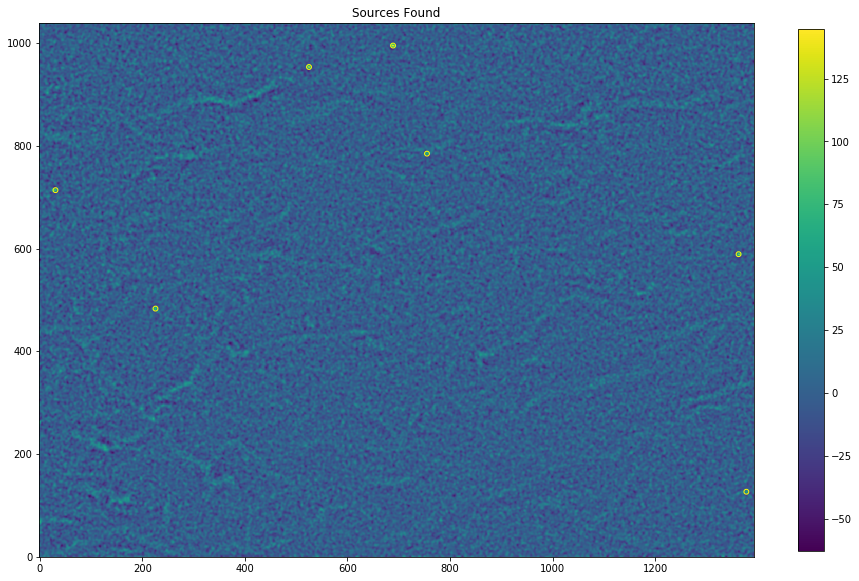

In [87]:
Imshow(image_srcfind, title="Sources Found")
apertures.plot(color='yellow')

6 of these look pretty believable. The bottom right one looks pretty sketchy.


Now for the million dollar question. How well will the wiener filtering work in the fourier space after applying the flat field reduction?

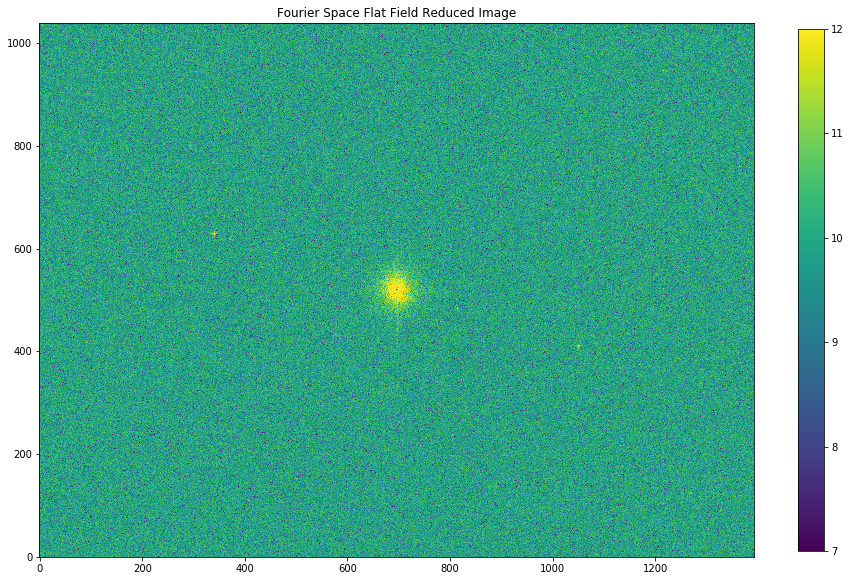

In [92]:
# Note the use of fftfreq, and the ordering of the number of pixels along x and y
# This seems to correspond with the way the display is labeled in imshow
ny, nx = image.shape
kx = np.outer(np.ones(ny), np.fft.fftfreq(nx))
ky = np.outer(np.fft.fftfreq(ny), np.ones(nx))
k = np.power(kx**2 + ky**2, 0.5)
kextent = [kx.min(),kx.max(),ky.min(),ky.max()]

pimage = psd2d(image)
tmp = pimage.copy()
tmp[ky == 0] = 1e9
tmp[kx == 0] = 1e9
mfpimage = scimg.median_filter(tmp, [7,7])

Imshow(np.fft.fftshift(np.log10(pimage)), title="Fourier Space Flat Field Reduced Image", vmin=7, vmax=12)

The horizontal and vertical spikes seem to mostly dissapear!

C:\Users\16472\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in log10
  
C:\Users\16472\anaconda3\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in log10
  


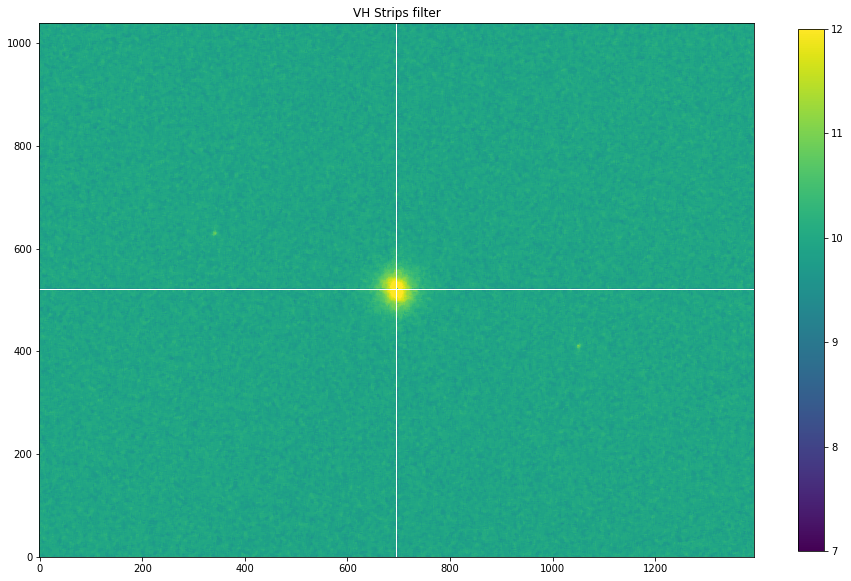

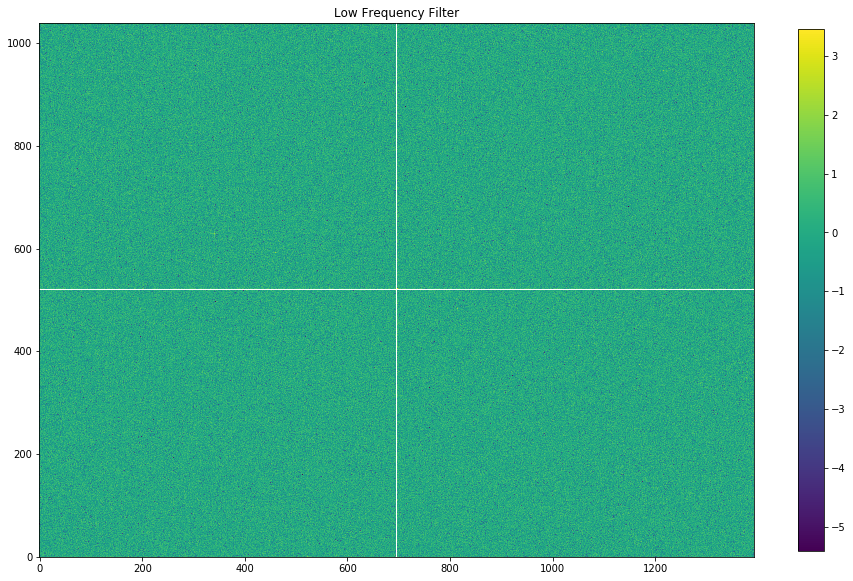

In [99]:
# Let's build a filter that suppresses the REMAINING horizontal and vertical streaks
xyfilt = np.ones_like(image)
xyfilt[ky == 0] = 0
xyfilt[kx == 0] = 0

Imshow(np.fft.fftshift(np.log10(mfpimage*xyfilt)), title="VH Strips filter", vmin=7, vmax=12)

Imshow(np.fft.fftshift(np.log10(pimage/mfpimage*xyfilt)), title="Low Frequency Filter")

The two bright points on across the diagonal seem to mostly dissapear as well!

In [100]:
kbins = np.logspace(np.log10(k[k>0].min()),np.log10(k.max()))

psd1d, psd1d_be, psd1d_indx = binned_statistic(k.flatten(), (pimage*xyfilt).flatten(), bins=kbins)

def pwrlaw(k, A = 2.0e12, k0 = 0.01, alpha=2.5):
    return A*np.power(k/k0, -alpha) 
white = 1.5e10

psd1d

array([           nan,            nan, 0.00000000e+00, 5.72249496e+13,
       0.00000000e+00,            nan, 8.90796796e+13, 2.95267381e+13,
       2.06481285e+13, 1.00333439e+13, 1.48331378e+13, 2.03734669e+13,
       1.13459823e+13, 7.43338643e+12, 8.58078185e+12, 5.10856295e+12,
       4.56362689e+12, 3.95479486e+12, 2.36677829e+12, 1.78858292e+12,
       1.14669765e+12, 6.84198527e+11, 5.16994056e+11, 3.52942710e+11,
       1.95985343e+11, 1.19518500e+11, 7.63539682e+10, 4.80878937e+10,
       3.31929986e+10, 2.41925162e+10, 1.83164496e+10, 1.53688266e+10,
       1.38338179e+10, 1.26364545e+10, 1.29056275e+10, 1.27211542e+10,
       1.23682180e+10, 1.22045183e+10, 1.22390349e+10, 1.23395674e+10,
       1.22272165e+10, 1.23971263e+10, 1.28521366e+10, 1.24111284e+10,
       1.24231213e+10, 1.24784855e+10, 1.25658402e+10, 1.27546081e+10,
       1.28057114e+10])

<Figure size 432x288 with 0 Axes>

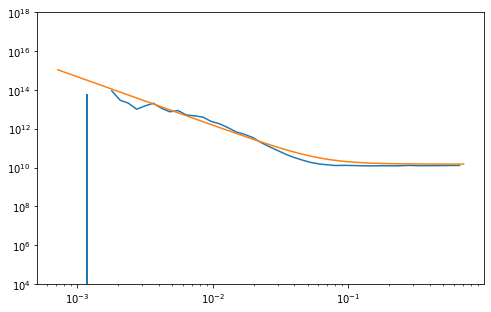

In [101]:
plt.clf()
plt.figure(figsize=(8,5))
#plt.loglog(k.flatten(),pimage.flatten(),'.', label='all')
#plt.loglog(k.flatten(),(pimage*xyfilt).flatten(),'.', label='xyfilt')
plt.loglog(BinCenter(psd1d_be),psd1d)
plt.plot(kbins, pwrlaw(kbins, A=1.5e12) + white)
plt.ylim([1e4,1e18])
plt.show()

C:\Users\16472\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in power
  


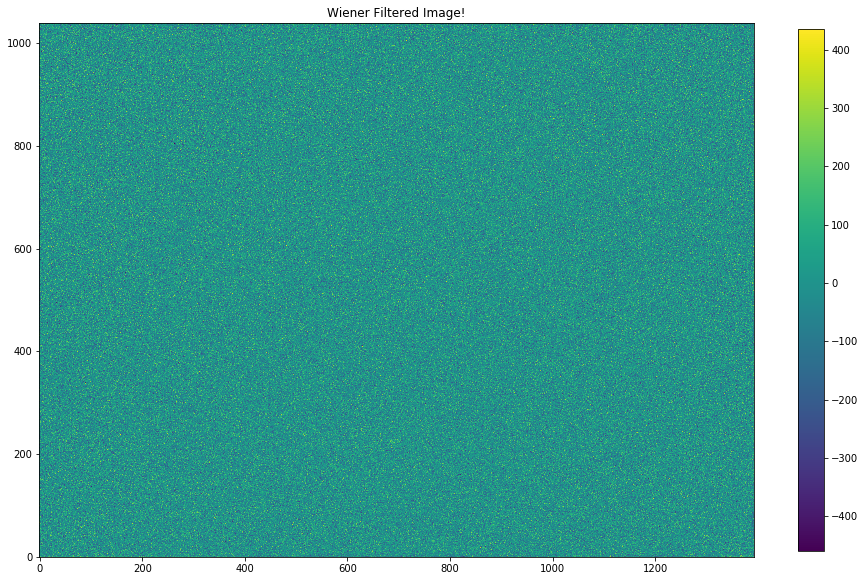

In [103]:
wfilt = white/(pwrlaw(k) + white) * xyfilt
#wfilt = 1.5e10/np.sqrt(mfpimage)*xyfilt
wfilt[k==0] = 0

# Moment of truth
wfimage = np.fft.ifft2(np.fft.fft2(image)*wfilt).real

# After Wiener filtering, the result is pretty much white noise ...
Imshow(wfimage, title="Wiener Filtered Image!")

In [104]:
swfimage = gf(wfimage, sigma=3)

sources_wf, apertures_wf = FindSources(swfimage, fwhm = fwhm, threshold_sigma=2.8)
sources_wf

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64
1,225.98001524932096,483.2813732655716,0.3449492741413454,0.019093184007230247,-0.27705684799524155,25,0.0,23.149986108012968,1.3301002354225482,-0.30971092582110515
2,135.41087387100285,555.8540298392758,0.3452494234996952,0.11707409208743262,-0.08697278236185345,25,0.0,15.51127166641297,1.015281235242122,-0.01646589871625141
3,1362.1464915541437,589.3836260028423,0.34425218032680704,-0.06546110149734297,-0.49151736779206057,25,0.0,30.70907394192864,1.8525579941948667,-0.6694295310542946
4,755.2195650879354,785.4108531528998,0.3449288470987095,0.05458258925839707,-0.4146394950163451,25,0.0,18.12154290363113,1.158869630699347,-0.16008645476559571
5,1363.9633883351546,914.0671271680038,0.3461522978244349,0.100783100382918,0.15730497960159998,25,0.0,13.412976981649711,1.0123958382311935,-0.013375877967461203
6,525.0278065674738,954.0999892570759,0.3440045690077436,-0.11003981685770128,-0.31327591008412325,25,0.0,37.45751012375479,2.294318422257836,-0.9016342307665103
7,688.8762501266964,995.9735595762605,0.34483718929743673,-0.11031680510381127,-0.469190724005777,25,0.0,42.832336277526046,2.4786382117503964,-0.9855328517048806
8,1369.556054143564,1030.8665248548705,0.3456266290566386,0.12745064978611595,-0.39251968620060484,25,0.0,0.527370823119865,1.1226789079312454,-0.12563890878978398


Seems to find one more source. Perhaps we can lower the threshold?

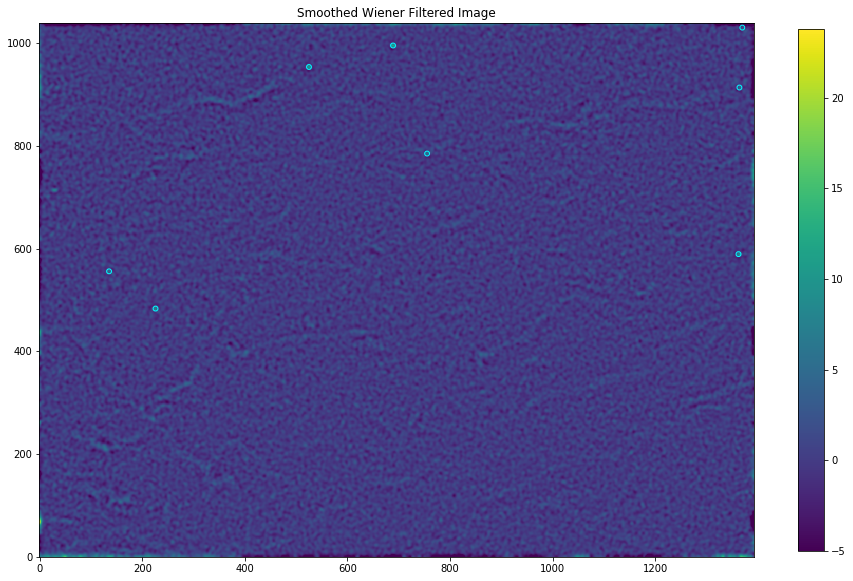

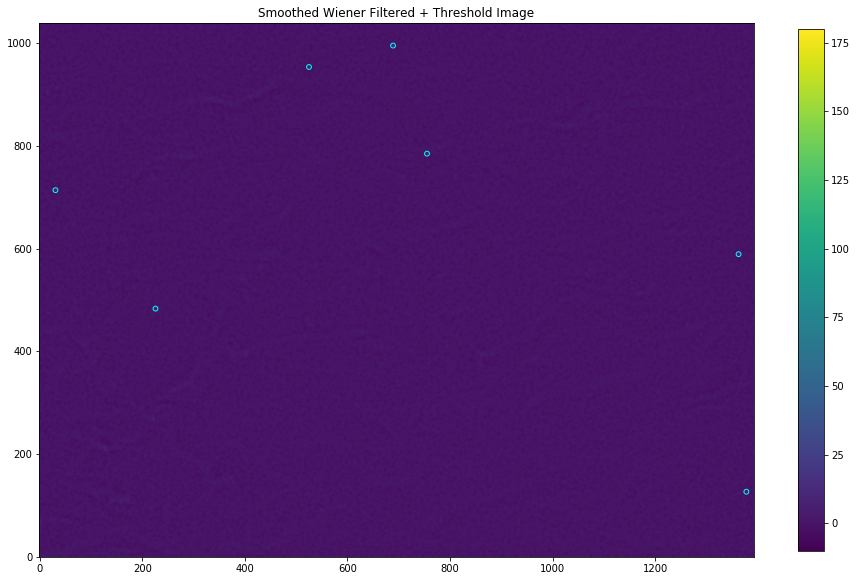

In [107]:
# If we smooth that image, the residual of the clouds is pretty clear.  That structure is not what you'd expect
# from a Gaussian random field
Imshow(swfimage/mad_std(swfimage), title="Smoothed Wiener Filtered Image", vmin = -5)#, vmax=10)
apertures_wf.plot(color='cyan')

Imshow(image_srcfind/mad_std(image_srcfind), title="Smoothed Wiener Filtered + Threshold Image", vmin=-10, vmax=180)
apertures.plot(color='cyan')

Some Key Takeaways (After using the flat field reduction)

1) The Flat field reduction finds us 7 sources that without the need for wiener filtering. The normal image finds the same 7 sources after applying the wiener filtering.

2) The horizontal and vertical spikes seem to mostly dissapear in the fourier space after applying the flat field

3) 8 Sources were found post wiener filtering. Though only 6 of them look to be believable candidates.

4) The image has a smooth gaussian shape comapred to when the flat field was not applied.